
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


Keyhan Hodaei - 401106696

In [1]:
# from google.colab import drive
# drive.mount('/content/drive/')

This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [ ]:
# !pip install pytorch_lightning
# !pip install seaborn

True


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [4]:
import os
import pandas as pd
from tqdm import tqdm
from sklearn.utils import shuffle

def load_data(PATH):
    # TODO: Initialize lists to store filenames and their corresponding outcomes
    filenames, outcomes = [], []
            
    # TODO: Create a DataFrame from the filenames and outcomes
    for root, dirs, files in os.walk(PATH): 
        for file in files:
            if file.endswith('.jpg'):
                filenames.append(os.path.join(root, file))
                outcomes.append(os.path.basename(root))
    df = pd.DataFrame({'filename': filenames, 'outcome': outcomes})

    # TODO: Return the shuffled DataFrame
    return shuffle(df, random_state=42).reset_index(drop=True)


# TODO: Load the training, validation, and test data using the load_data function
train_data = load_data('/kaggle/input/image-colorization-using-vae-data/train-20241214T143627Z-001/train')
val_data = load_data('/kaggle/input/image-colorization-using-vae-data/valid-20241214T143532Z-001/valid')
test_data = load_data('/kaggle/input/image-colorization-using-vae-data/test-20241214T143528Z-001/test')

# TODO: Check the shape of the loaded DataFrames to verify correct data loading
print(f'Train data shape: {train_data.shape}\nValidation data shape: {val_data.shape}\nTest data shape: {test_data.shape}')

Train data shape: (3208, 2)
Validation data shape: (100, 2)
Test data shape: (100, 2)


In [5]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
combined_data = pd.concat([train_data, test_data], axis=0).reset_index(drop=True)
combined_data.shape

(3308, 2)

In [6]:
# TODO: Explore the new DataFrame
combined_data.head(20)

,filename,outcome
0,/kaggle/input/image-colorization-using-vae-dat...,ABYSSINIAN GROUND HORNBILL
1,/kaggle/input/image-colorization-using-vae-dat...,ABBOTTS BOOBY
2,/kaggle/input/image-colorization-using-vae-dat...,AFRICAN OYSTER CATCHER
3,/kaggle/input/image-colorization-using-vae-dat...,AFRICAN OYSTER CATCHER
4,/kaggle/input/image-colorization-using-vae-dat...,AFRICAN OYSTER CATCHER
5,/kaggle/input/image-colorization-using-vae-dat...,ABYSSINIAN GROUND HORNBILL
6,/kaggle/input/image-colorization-using-vae-dat...,AFRICAN OYSTER CATCHER
7,/kaggle/input/image-colorization-using-vae-dat...,AMERICAN AVOCET
8,/kaggle/input/image-colorization-using-vae-dat...,ALBERTS TOWHEE
9,/kaggle/input/image-colorization-using-vae-dat...,ALEXANDRINE PARAKEET


## Plot some of the images

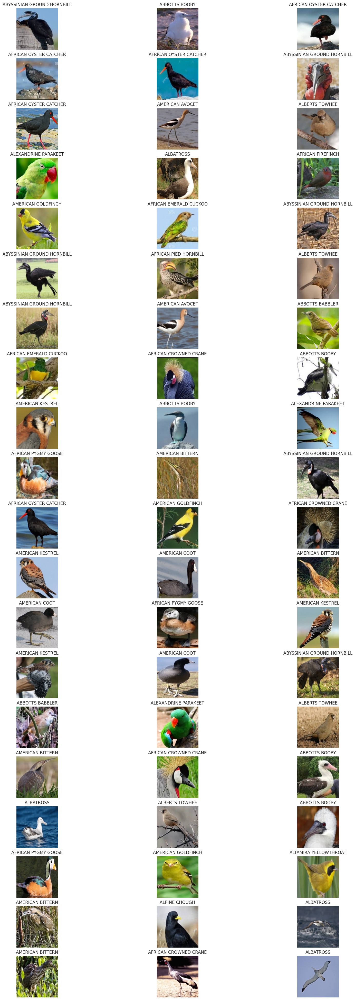

In [7]:
# TODO: Plot some of images
fig, ax = plt.subplots(20, 3, figsize=(20, 50))
for i in range(60):
    img = plt.imread(combined_data['filename'][i])
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].axis('off')
    ax[i//3, i%3].set_title(combined_data['outcome'][i])
plt.show()

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

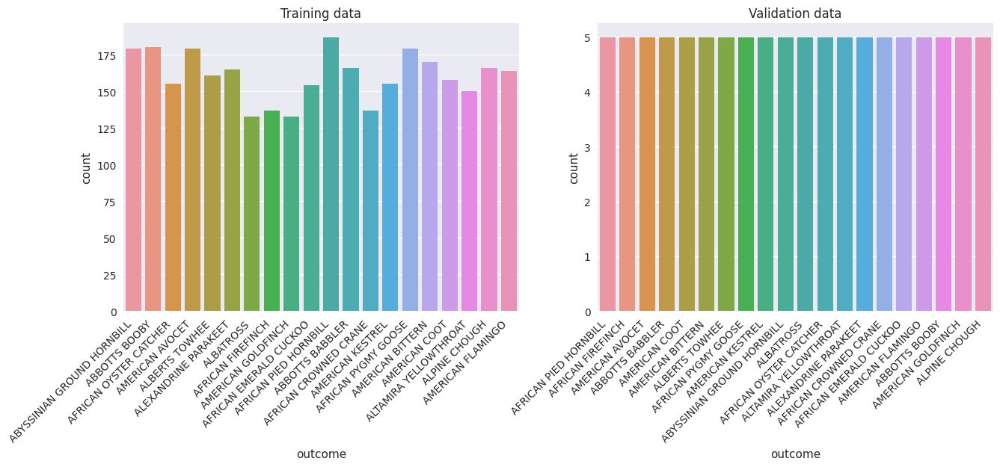

In [8]:
# TODO: Plot the distribution of classes
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sea.countplot(data=train_data, x='outcome', ax=ax[0])
sea.countplot(data=val_data, x='outcome', ax=ax[1])
ax[0].set_title('Training data')
ax[1].set_title('Validation data')
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=45, ha='right')
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=45, ha='right')
plt.show()

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [9]:
import cv2
from PIL import Image

class BirdDataset:
    def __init__(self, df, in_transform=None, tar_transform=None):
        # TODO: Initialize the needed data
        self.df = df
        self.in_transform = in_transform
        self.tar_transform = tar_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # TODO: Load and transform an image
        # - Image should be converted to grayscale and then transformed
        img_path = self.df['filename'][idx]
        img = cv2.imread(img_path)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        rgb_img = img

        gray_img = Image.fromarray(gray_img)
        rgb_img = Image.fromarray(rgb_img)
        if self.in_transform:
            gray_img = self.in_transform(gray_img)
        if self.tar_transform:
            rgb_img = self.tar_transform(rgb_img)

        return gray_img, rgb_img


in_transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor()
])

tar_transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ColorJitter(brightness=.2,
                           contrast=.2,
                           saturation=.2,
                           hue=.1),
    transforms.ToTensor()
])

train_dataset = BirdDataset(train_data, in_transform, tar_transform)
val_dataset = BirdDataset(val_data, in_transform, tar_transform)
test_dataset = BirdDataset(test_data, in_transform, tar_transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

next(iter(train_loader))[0].shape, next(iter(train_loader))[1].shape, next(iter(train_loader))[0].type(), next(iter(train_loader))[1].type()

(torch.Size([64, 1, 160, 160]),
 torch.Size([64, 3, 160, 160]),
 'torch.FloatTensor',
 'torch.FloatTensor')

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [11]:
import torchvision.models as models
import torch.nn as nn
import torch
import torch.optim as optim
from tqdm import tqdm
import math
from torchvision import transforms

# The following classes define the various components of our VAE model. 
# Each class includes a simple explanation of its role in the overall architecture.

# The VAE consists of an encoder to compress the input into a smaller latent representation,
# and a decoder to reconstruct the colorized output from the latent space.


# Hint for students: Initialize the perceptual loss with different feature layers based on the network architecture.
# - You have to use VGG pretrained model for this part
class PerceptualLoss(nn.Module):  
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg16(pretrained=True).features
        self.feature_layers = feature_layers if feature_layers else [4, 9, 16]
        self.vgg_layers = [vgg[layer] for layer in self.feature_layers]

        for layer in self.vgg_layers:
            for param in layer.parameters():
                param.requires_grad = False

        self.use_half = use_half
        if self.use_half:
            self.vgg_layers = [layer.half() for layer in self.vgg_layers]

    def forward(self, x, y):
        if self.use_half:
            x = x.half()
            y = y.half()

        x = x.expand(-1, 3, -1, -1) 
        y = y.expand(-1, 3, -1, -1)

        loss = 0
        for layer in self.vgg_layers:
            x = layer(x)
            y = layer(y)
            loss += F.l1_loss(x, y)
        return loss

        
# Hint: Define the structure of the encoder by using convolutional layers with optional batch normalization.
class Encoder(nn.Module):  
    def __init__(self, do_bn=False):
        super().__init__()
        self.do_bn = do_bn

        
        self.encoder = nn.Sequential(
            self.inner_block(1, 32),
            self.inner_block(32, 64),
            self.inner_block(64, 128),
            self.inner_block(128, 256),
        )

        self.latent_mean = nn.Linear(in_features=10*10*256, out_features=256)
        self.latent_var = nn.Linear(in_features=10*10*256, out_features=256)
        self.flatten = nn.Flatten()

    def inner_block(self, in_c, out_c, maxpool=2):
        # TODO: Implement a sequential block containing convolution, batch norm, ReLU, pooling, and dropout layers.
        return nn.Sequential(
            nn.Conv2d(in_channels=in_c, out_channels=out_c, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=maxpool, stride=maxpool),
            nn.Dropout(.2)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.flatten(x)

        l_mean, l_var = self.latent_mean(x), self.latent_var(x)
        return l_mean, l_var

        
# Hint: Define the decoder's symmetric structure to the encoder for upsampling and reconstructing the input.
class Decoder(nn.Module):  
    def __init__(self, do_bn):
        # TODO: Use ConvTransposed2d
        super().__init__()
        self.do_bn = do_bn

        self.fc = nn.Linear(in_features=256, out_features=10*10*256)
        
        self.decoder = nn.Sequential(
            self.inner_block(256, 128),
            self.inner_block(128, 64),
            self.inner_block(64, 32),
            self.inner_block(32, 16)
        )

        self.out = nn.Conv2d(in_channels=16, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.flatten = nn.Flatten()

    def inner_block(self, in_c, out_c, out=False):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels=in_c, out_channels=out_c, kernel_size=2, stride=2),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU()
        )


    def forward(self, h):
        h = self.fc(h)
        h = h.view(h.size(0), 256, 10, 10)
        h = self.decoder(h)
        out = self.out(h)
        out = torch.sigmoid(out)
        return out
        

        
# Hint: Integrate the encoder, decoder, and loss components into the overall network class.
class Net(nn.Module):  
    def __init__(self, use_perceptual):
        super().__init__()
        self.encoder = Encoder(do_bn=True)
        self.decoder = Decoder(do_bn=True)
        self.use_perceptual = use_perceptual
        self.perceptual_loss = None
        if self.use_perceptual:
            self.perceptual_loss = PerceptualLoss()

    def forward(self, x):
        l_mean, l_var = self.encoder(x)
        x = l_mean + torch.exp(.5 * l_var)
        rec_img = self.decoder(x)
        return rec_img, l_mean, l_var
        

    def compute_loss(self, pred, target, l_mean, l_var, beta=1., gamma=1.):
        criterion = nn.MSELoss()
        kl_divergence = torch.mean(-0.5 * torch.mean(1 + l_var - l_mean**2 - l_var.exp(), dim=1), dim=0)
        mse_loss = criterion(pred, target)
        perceptual_loss = 0.5 * self.perceptual_loss(pred, target) if self.use_perceptual else 0
        return mse_loss + beta * kl_divergence + gamma * perceptual_loss



    def training_step(self, X, optimizer):
        optimizer.zero_grad()
        gray_img, rgb_img = X
        gray_img, rgb_img = gray_img.to(device), rgb_img.to(device)
        pred, l_mean, l_var = self(gray_img)
        loss = self.compute_loss(pred, rgb_img, l_mean, l_var, 1e-6, 1e-2)
        loss.backward()
        optimizer.step()
        return loss.item()

    def validation_step(self, X):
        with torch.no_grad():
            gray_img, rgb_img = X
            gray_img, rgb_img = gray_img.to(device), rgb_img.to(device)
            pred, l_mean, l_var = self(gray_img)
            loss = self.compute_loss(pred, rgb_img, l_mean, l_var, 1e-6, 1e-2)
            return loss.item()

    def train_model(self, epochs=10):
        train_losses, val_losses = [], []
        optimizer = optim.Adam(self.parameters(), lr=1e-3)
        scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=1e-3, steps_per_epoch=len(train_loader), epochs=epochs)
        for epoch in range(epochs):
            train_loss, val_loss = 0., 0.
            for batch in tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}'):
                loss = self.training_step(batch, optimizer)
                train_loss += loss
            for batch in tqdm(val_loader, desc=f'Epoch {epoch+1}/{epochs}'):
                loss = self.validation_step(batch)
                val_loss += loss
            train_losses.append(train_loss/len(train_loader))
            val_losses.append(val_loss/len(val_loader))
            scheduler.step()
            print(f'[Epoch: {epoch+1}] [Train Loss: {train_losses[-1]:.4f}] [Val Loss: {val_losses[-1]:.4f}]')
        return train_losses, val_losses


In [12]:
# TODO: print the model
model1 = Net(False).to(device)
print(model1)

Net(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Sequential(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Dropout(p=0.2, inplace=False)
      )
      (1): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Dropout(p=0.2, inplace=False)
      )
      (2): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d

## Training Phase

In [13]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
train_losses, val_losses = model1.train_model(epochs=50)

Epoch 1/50: 100%|██████████| 2/2 [00:01<00:00,  1.87it/s]


[Epoch: 1] [Train Loss: 0.0660] [Val Loss: 0.0623]


Epoch 2/50: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]


[Epoch: 2] [Train Loss: 0.0581] [Val Loss: 0.0589]


Epoch 3/50: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]


[Epoch: 3] [Train Loss: 0.0525] [Val Loss: 0.0526]


Epoch 4/50: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]


[Epoch: 4] [Train Loss: 0.0468] [Val Loss: 0.0480]


Epoch 5/50: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]


[Epoch: 5] [Train Loss: 0.0428] [Val Loss: 0.0422]


Epoch 6/50: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]


[Epoch: 6] [Train Loss: 0.0405] [Val Loss: 0.0391]


Epoch 7/50: 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


[Epoch: 7] [Train Loss: 0.0376] [Val Loss: 0.0380]


Epoch 8/50: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]


[Epoch: 8] [Train Loss: 0.0353] [Val Loss: 0.0355]


Epoch 9/50: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 9] [Train Loss: 0.0335] [Val Loss: 0.0363]


Epoch 10/50: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]


[Epoch: 10] [Train Loss: 0.0315] [Val Loss: 0.0320]


Epoch 11/50: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]


[Epoch: 11] [Train Loss: 0.0301] [Val Loss: 0.0277]


Epoch 12/50: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]


[Epoch: 12] [Train Loss: 0.0285] [Val Loss: 0.0275]


Epoch 13/50: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]


[Epoch: 13] [Train Loss: 0.0276] [Val Loss: 0.0284]


Epoch 14/50: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]


[Epoch: 14] [Train Loss: 0.0274] [Val Loss: 0.0263]


Epoch 15/50: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]


[Epoch: 15] [Train Loss: 0.0266] [Val Loss: 0.0276]


Epoch 16/50: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]


[Epoch: 16] [Train Loss: 0.0260] [Val Loss: 0.0282]


Epoch 17/50: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]


[Epoch: 17] [Train Loss: 0.0260] [Val Loss: 0.0261]


Epoch 18/50: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]


[Epoch: 18] [Train Loss: 0.0256] [Val Loss: 0.0265]


Epoch 19/50: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 19] [Train Loss: 0.0255] [Val Loss: 0.0249]


Epoch 20/50: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]


[Epoch: 20] [Train Loss: 0.0252] [Val Loss: 0.0252]


Epoch 21/50: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]


[Epoch: 21] [Train Loss: 0.0251] [Val Loss: 0.0250]


Epoch 22/50: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]


[Epoch: 22] [Train Loss: 0.0246] [Val Loss: 0.0253]


Epoch 23/50: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


[Epoch: 23] [Train Loss: 0.0243] [Val Loss: 0.0250]


Epoch 24/50: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]


[Epoch: 24] [Train Loss: 0.0245] [Val Loss: 0.0257]


Epoch 25/50: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]


[Epoch: 25] [Train Loss: 0.0248] [Val Loss: 0.0246]


Epoch 26/50: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]


[Epoch: 26] [Train Loss: 0.0246] [Val Loss: 0.0244]


Epoch 27/50: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 27] [Train Loss: 0.0241] [Val Loss: 0.0246]


Epoch 28/50: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 28] [Train Loss: 0.0236] [Val Loss: 0.0249]


Epoch 29/50: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]


[Epoch: 29] [Train Loss: 0.0236] [Val Loss: 0.0257]


Epoch 30/50: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]


[Epoch: 30] [Train Loss: 0.0238] [Val Loss: 0.0240]


Epoch 31/50: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]


[Epoch: 31] [Train Loss: 0.0236] [Val Loss: 0.0252]


Epoch 32/50: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]


[Epoch: 32] [Train Loss: 0.0234] [Val Loss: 0.0253]


Epoch 33/50: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


[Epoch: 33] [Train Loss: 0.0234] [Val Loss: 0.0232]


Epoch 34/50: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]


[Epoch: 34] [Train Loss: 0.0235] [Val Loss: 0.0242]


Epoch 35/50: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 35] [Train Loss: 0.0231] [Val Loss: 0.0230]


Epoch 36/50: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]


[Epoch: 36] [Train Loss: 0.0226] [Val Loss: 0.0241]


Epoch 37/50: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]


[Epoch: 37] [Train Loss: 0.0228] [Val Loss: 0.0237]


Epoch 38/50: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]


[Epoch: 38] [Train Loss: 0.0232] [Val Loss: 0.0246]


Epoch 39/50: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]


[Epoch: 39] [Train Loss: 0.0229] [Val Loss: 0.0240]


Epoch 40/50: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]


[Epoch: 40] [Train Loss: 0.0228] [Val Loss: 0.0233]


Epoch 41/50: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 41] [Train Loss: 0.0225] [Val Loss: 0.0231]


Epoch 42/50: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]


[Epoch: 42] [Train Loss: 0.0228] [Val Loss: 0.0243]


Epoch 43/50: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]


[Epoch: 43] [Train Loss: 0.0226] [Val Loss: 0.0229]


Epoch 44/50: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]


[Epoch: 44] [Train Loss: 0.0225] [Val Loss: 0.0244]


Epoch 45/50: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 45] [Train Loss: 0.0224] [Val Loss: 0.0227]


Epoch 46/50: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]


[Epoch: 46] [Train Loss: 0.0223] [Val Loss: 0.0235]


Epoch 47/50: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]


[Epoch: 47] [Train Loss: 0.0221] [Val Loss: 0.0235]


Epoch 48/50: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 48] [Train Loss: 0.0224] [Val Loss: 0.0224]


Epoch 49/50: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]


[Epoch: 49] [Train Loss: 0.0222] [Val Loss: 0.0231]


Epoch 50/50: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

[Epoch: 50] [Train Loss: 0.0222] [Val Loss: 0.0218]


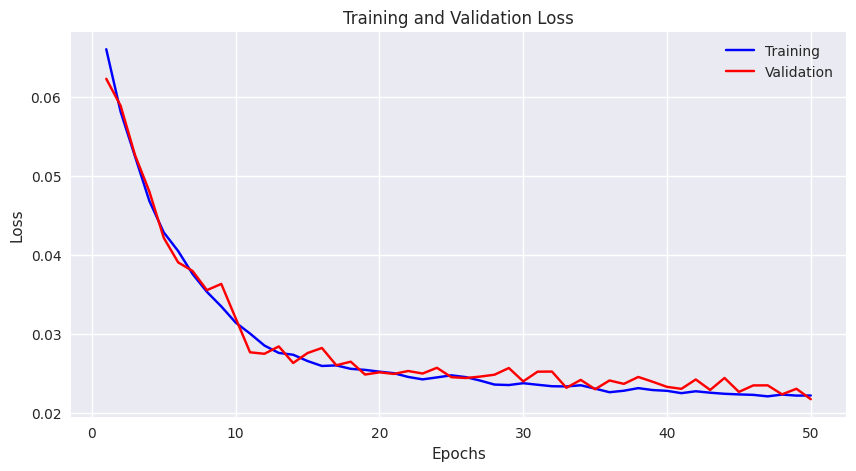

In [14]:
# TODO: Plot training and validation loss over epochs
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(range(1, 51), train_losses, label='Training', color='blue')
ax.plot(range(1, 51), val_losses, label='Validation', color='red')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title('Training and Validation Loss')
ax.legend()
plt.show()

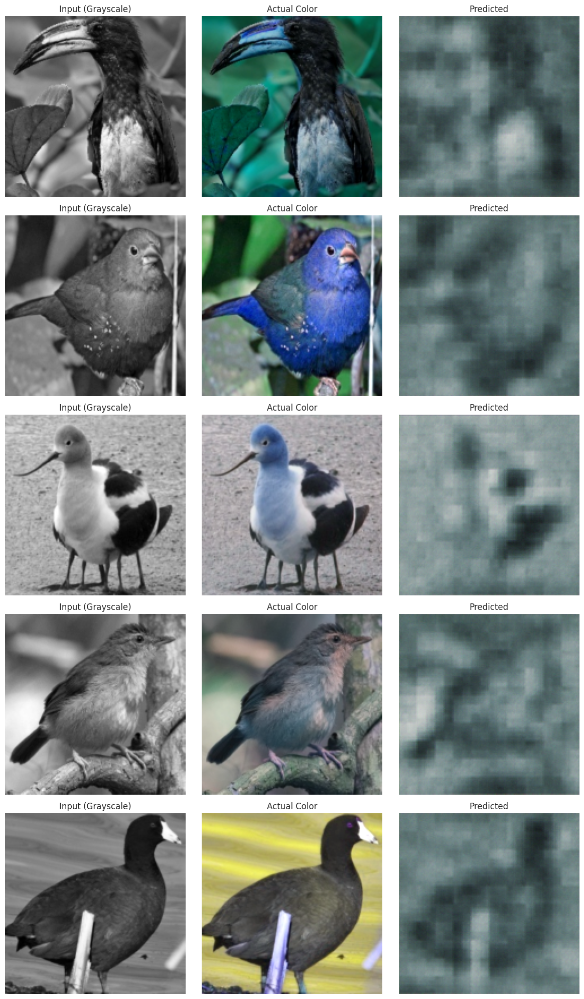

In [15]:
def visualize_predictions(model, data_loader, num_samples=5):
    model.eval()

    with torch.no_grad():
        for gray_img, rgb_img in data_loader:
            gray_img, rgb_img = gray_img.to(device), rgb_img.to(device)

            pred, _, _ = model(gray_img)
            gray_img = gray_img.cpu().squeeze(1).numpy()
            rgb_img = rgb_img.cpu().permute(0, 2, 3, 1).numpy()
            pred = pred.cpu().permute(0, 2, 3, 1).numpy()

            gray_img = (gray_img * 255).clip(0, 255).astype('uint8')
            rgb_img = (rgb_img * 255).clip(0, 255).astype('uint8')
            pred = (pred * 255).clip(0, 255).astype('uint8')

            fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))
            for i in range(num_samples):
                axes[i, 0].imshow(gray_img[i], cmap='gray')
                axes[i, 0].set_title("Input (Grayscale)")
                axes[i, 0].axis('off')

                axes[i, 1].imshow(rgb_img[i])
                axes[i, 1].set_title("Actual Color")
                axes[i, 1].axis('off')

                axes[i, 2].imshow(pred[i])
                axes[i, 2].set_title("Predicted")
                axes[i, 2].axis('off')

            plt.tight_layout()
            plt.show()
            break

visualize_predictions(model1, test_loader, 5)

In [16]:
model2 = Net(True).to(device)
print(model2)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 220MB/s] 


Net(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Sequential(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Dropout(p=0.2, inplace=False)
      )
      (1): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Dropout(p=0.2, inplace=False)
      )
      (2): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d

In [17]:
train_losses, val_losses = model2.train_model(epochs=30)

Epoch 1/30: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 1] [Train Loss: 0.0673] [Val Loss: 0.0659]


Epoch 2/30: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 2] [Train Loss: 0.0607] [Val Loss: 0.0585]


Epoch 3/30: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 3] [Train Loss: 0.0533] [Val Loss: 0.0485]


Epoch 4/30: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]


[Epoch: 4] [Train Loss: 0.0467] [Val Loss: 0.0457]


Epoch 5/30: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]


[Epoch: 5] [Train Loss: 0.0428] [Val Loss: 0.0388]


Epoch 6/30: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]


[Epoch: 6] [Train Loss: 0.0386] [Val Loss: 0.0381]


Epoch 7/30: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]


[Epoch: 7] [Train Loss: 0.0365] [Val Loss: 0.0370]


Epoch 8/30: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]


[Epoch: 8] [Train Loss: 0.0342] [Val Loss: 0.0340]


Epoch 9/30: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]


[Epoch: 9] [Train Loss: 0.0329] [Val Loss: 0.0340]


Epoch 10/30: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]


[Epoch: 10] [Train Loss: 0.0318] [Val Loss: 0.0313]


Epoch 11/30: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s]


[Epoch: 11] [Train Loss: 0.0311] [Val Loss: 0.0336]


Epoch 12/30: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]


[Epoch: 12] [Train Loss: 0.0300] [Val Loss: 0.0304]


Epoch 13/30: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 13] [Train Loss: 0.0294] [Val Loss: 0.0290]


Epoch 14/30: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


[Epoch: 14] [Train Loss: 0.0288] [Val Loss: 0.0286]


Epoch 15/30: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]


[Epoch: 15] [Train Loss: 0.0286] [Val Loss: 0.0296]


Epoch 16/30: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]


[Epoch: 16] [Train Loss: 0.0281] [Val Loss: 0.0293]


Epoch 17/30: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


[Epoch: 17] [Train Loss: 0.0281] [Val Loss: 0.0310]


Epoch 18/30: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]


[Epoch: 18] [Train Loss: 0.0275] [Val Loss: 0.0273]


Epoch 19/30: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]


[Epoch: 19] [Train Loss: 0.0274] [Val Loss: 0.0277]


Epoch 20/30: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


[Epoch: 20] [Train Loss: 0.0271] [Val Loss: 0.0262]


Epoch 21/30: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]


[Epoch: 21] [Train Loss: 0.0266] [Val Loss: 0.0277]


Epoch 22/30: 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]


[Epoch: 22] [Train Loss: 0.0264] [Val Loss: 0.0273]


Epoch 23/30: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


[Epoch: 23] [Train Loss: 0.0264] [Val Loss: 0.0279]


Epoch 24/30: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


[Epoch: 24] [Train Loss: 0.0262] [Val Loss: 0.0275]


Epoch 25/30: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]


[Epoch: 25] [Train Loss: 0.0263] [Val Loss: 0.0261]


Epoch 26/30: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


[Epoch: 26] [Train Loss: 0.0263] [Val Loss: 0.0279]


Epoch 27/30: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]


[Epoch: 27] [Train Loss: 0.0263] [Val Loss: 0.0270]


Epoch 28/30: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]


[Epoch: 28] [Train Loss: 0.0258] [Val Loss: 0.0264]


Epoch 29/30: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


[Epoch: 29] [Train Loss: 0.0257] [Val Loss: 0.0265]


Epoch 30/30: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

[Epoch: 30] [Train Loss: 0.0252] [Val Loss: 0.0275]


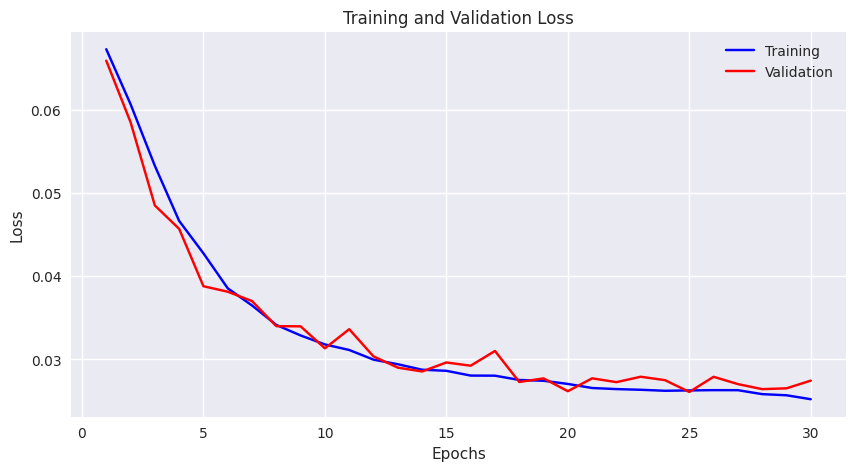

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(range(1, 31), train_losses, label='Training', color='blue')
ax.plot(range(1, 31), val_losses, label='Validation', color='red')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title('Training and Validation Loss')
ax.legend()
plt.show()

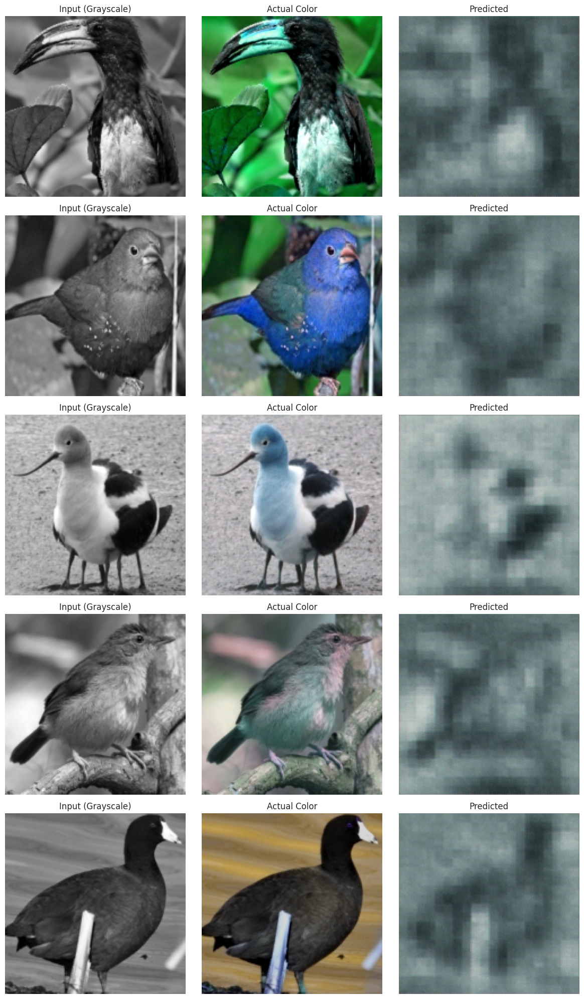

In [19]:
visualize_predictions(model2, test_loader, 5)

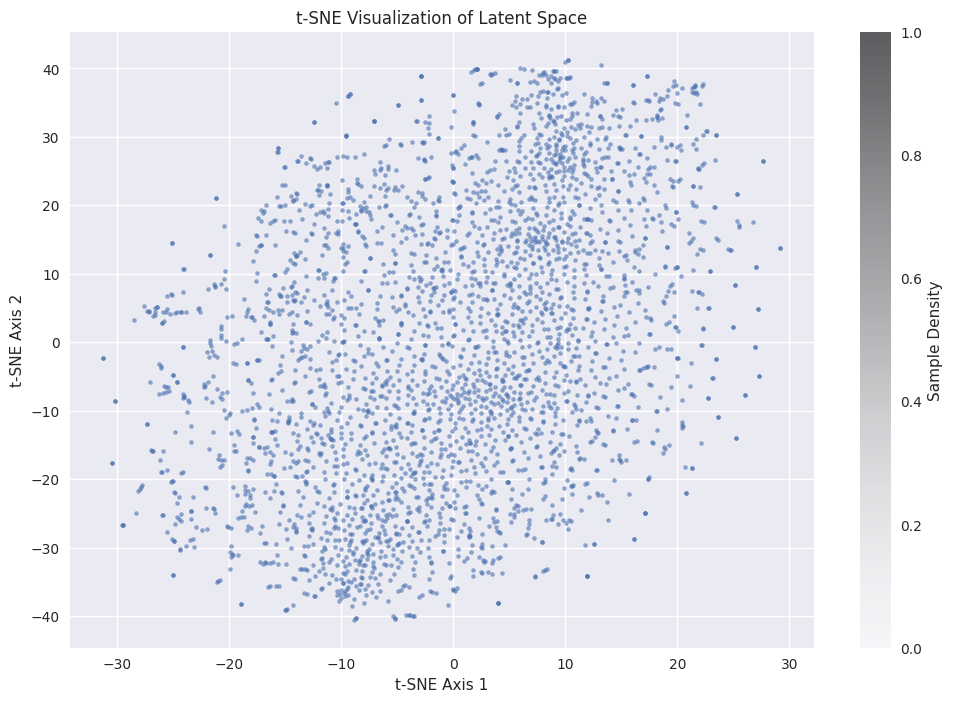

In [20]:
from sklearn.manifold import TSNE

def plot_latent_projection(encoder_model, loader, sample_limit=1000):
    encoder_model.eval()
    latent_space = []
    with torch.no_grad():
        for batch_idx, (inputs, _) in enumerate(loader):
            if len(latent_space) * inputs.size(0) >= sample_limit:
                break
            inputs = inputs.to(device)
            mean_vector, _ = encoder_model(inputs)
            latent_space.append(mean_vector)

    latent_space = torch.cat(latent_space)[:sample_limit].cpu().numpy()

    tsne_perplexity = min(30, sample_limit - 1)
    tsne_mapper = TSNE(n_components=2, random_state=42, perplexity=tsne_perplexity)
    projected_latents = tsne_mapper.fit_transform(latent_space)

    plt.figure(figsize=(12, 8))
    plt.scatter(projected_latents[:, 0], projected_latents[:, 1], s=8, alpha=0.6)
    plt.title('t-SNE Visualization of Latent Space')
    plt.xlabel('t-SNE Axis 1')
    plt.ylabel('t-SNE Axis 2')
    plt.colorbar(label='Sample Density')
    plt.show()


plot_latent_projection(model1.encoder, train_loader, sample_limit=5000)


How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [21]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
from PIL import Image
print ('modules loaded')

modules loaded


## Load the Dataset

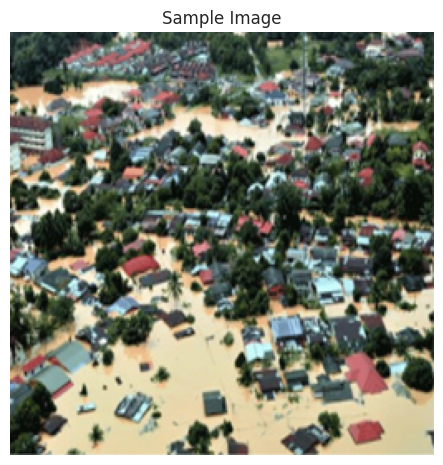

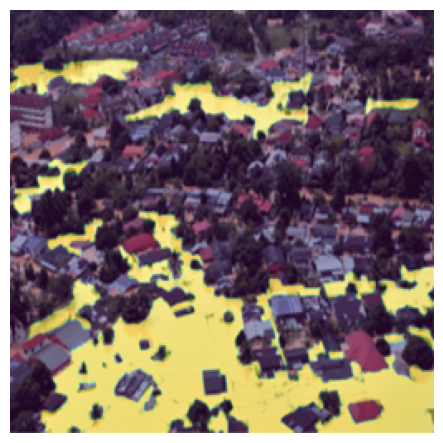

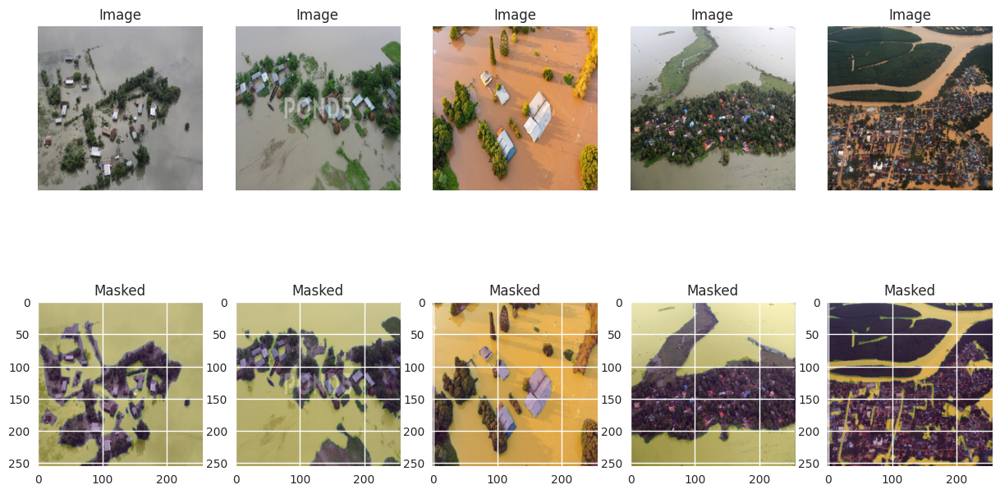

In [23]:
def create_data(image_dir, mask_dir):
    image_paths = []
    mask_paths = []
    image_folder = os.path.join(image_dir, 'Image')
    mask_folder = os.path.join(mask_dir, 'Mask')
    image_paths = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.jpg')])
    mask_paths = sorted([os.path.join(mask_folder, f) for f in os.listdir(mask_folder) if f.endswith('png')])
    
    return image_paths, mask_paths

def load_image(image_path, SIZE):
    image = Image.open(image_path).convert('RGB')
    image = image.resize((SIZE, SIZE))
    image_array = np.array(image) / 255.
    return image_array

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim:
        image_paths = image_paths[:trim]
    
    images = []
    for path in image_paths:
        img = Image.open(path)
        img = img.convert('L') if mask else img.convert('RGB')
        img = img.resize((SIZE, SIZE))
        img = np.array(img) / 255.
        if mask:
            img = np.expand_dims(img, axis=-1)
        images.append(img)
    
    return np.array(images)

def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()

def show_images(imgs, msks):
    sample_indices = np.random.choice(len(imgs), min(len(imgs), 5), replace=False)
    plt.figure(figsize=(15, 8))
    for i, idx in enumerate(sample_indices):
        plt.subplot(2, len(sample_indices), i + 1)
        plt.imshow(imgs[idx])
        plt.axis('off')
        plt.title('Image')

        plt.subplot(2, len(sample_indices), i + 1 + len(sample_indices)) 
        plt.imshow(imgs[idx])
        plt.imshow(msks[idx], cmap='viridis', alpha=0.3)
        plt.title('Masked')
    plt.show()

image_paths, mask_paths = create_data(
    '/kaggle/input/image-segmentation-with-unet-data/Image-20241215T151054Z-001',
    '/kaggle/input/image-segmentation-with-unet-data/Mask-20241215T151054Z-001'
    )
images = load_images(image_paths, 256)
masks = load_images(mask_paths, 256, mask=True)

show_image(images[0], title='Sample Image')
show_mask(images[0], masks[0], cmap='viridis')

show_images(images, masks)


## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [24]:
############# I've used the code that me and my team-mates had written for the first phase of our AI course Spring 2024 #############
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

class SegmentationDataset(Dataset):
    def __init__(self, images, masks):
        super(Dataset, self).__init__()
        self.images = images
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img, msk = self.images[idx], self.masks[idx]
        return torch.tensor(img, dtype=torch.float32).permute(2, 0, 1), torch.tensor(msk, dtype=torch.float32).permute(2, 0, 1)

class AttentionBlock(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(AttentionBlock, self).__init__()
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=2), nn.BatchNorm2d(F_int))
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU()

    def forward(self, x, g):
        w_x =self.W_x(x)
        w_g =self.W_g(g)
        psi = self.psi(self.relu(w_x + w_g))
        psi = nn.functional.upsample(psi, size=x.size()[2:], mode='bilinear', align_corners=True)
        return x * psi

class new_conv_block(nn.Module):
    def __init__(self, in_ch, out_ch, dropout_prob=0):
        super(new_conv_block, self).__init__()
        self.conv = nn.Sequential(nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
                                  nn.BatchNorm2d(out_ch),
                                  nn.ReLU(),
                                  nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                                  nn.ReLU(),
                                  nn.BatchNorm2d(out_ch)
                                  )
        self.dropout_prob = nn.Dropout2d(p=dropout_prob) if dropout_prob > 0 else None

    def forward(self, x):
        x = self.conv(x) if self.dropout_prob is None else self.dropout_prob(self.conv(x))
        return x

class new_upsample_block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(new_upsample_block, self).__init__()
        self.up = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2)
        self.conv1 = new_conv_block(2*out_ch, out_ch)
        self.att = AttentionBlock(out_ch, out_ch, in_ch)


    def forward(self, x, x2):
        up = self.up(x)
        attention = self.att(x2, x)
        merge = torch.cat((up, attention), dim=1)
        conv = self.conv1(merge)

        return conv


class UNet_With_Attention(nn.Module):
    def __init__(self, in_ch=3, out_channel=1):
        super(UNet_With_Attention, self).__init__()

        self.max_pool = nn.MaxPool2d(2 , 2)
        out_ch = 32
        self.block1 = new_conv_block(in_ch, out_ch)
        self.block2 = new_conv_block(out_ch, out_ch*2)
        self.block3 = new_conv_block(out_ch*2, out_ch*4)
        self.block4 = new_conv_block(out_ch*4, out_ch*8, dropout_prob=0.3)

        self.block5 = new_conv_block(out_ch*8, out_ch*16, dropout_prob=0.3)

        self.block6 = new_upsample_block(out_ch*16, out_ch*8)
        self.block7 = new_upsample_block(out_ch*8, out_ch*4)
        self.block8 = new_upsample_block(out_ch*4, out_ch*2)
        self.block9 = new_upsample_block(out_ch*2, out_ch)
        self.out_block = nn.Conv2d(out_ch , out_channel, kernel_size=1)


    def forward(self, x):
        conv1 = self.block1(x)
        pool1 = self.max_pool(conv1)

        conv2 = self.block2(pool1)
        pool2 = self.max_pool(conv2)

        conv3 = self.block3(pool2)
        pool3 = self.max_pool(conv3)

        conv4 = self.block4(pool3)
        pool4 = self.max_pool(conv4)

        conv5 = self.block5(pool4)

        up1 = self.block6(conv5, conv4)
        up2 = self.block7(up1, conv3)
        up3 = self.block8(up2, conv2)
        up4 = self.block9(up3, conv1)

        out = self.out_block(up4)

        return out

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred, target = pred.view(-1), target.view(-1)
        intersection = (pred * target).sum()
        dice_coeff = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)

        return 1 - dice_coeff
        


class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred, target = pred.view(-1), target.view(-1)
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        iou = (intersection + self.smooth) / (union + self.smooth)
        return 1 - iou

class Loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.jaccard_loss = JaccardLoss()
        self.dice_loss = DiceLoss()

    def forward(self, pred, target):
        return self.jaccard_loss(pred, target) + self.dice_loss(pred, target)

unet = UNet_With_Attention().to(device)
optimizer = torch.optim.Adam(unet.parameters(), lr=1e-5)
criterion = Loss().to(device)

train_images, val_images, train_masks, val_masks = train_test_split(images, masks, test_size=0.2, random_state=42)
train_dataset = SegmentationDataset(train_images, train_masks)
val_dataset = SegmentationDataset(val_images, val_masks)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Training

/tmp/ipykernel_23/2166767559.py:30: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  psi = nn.functional.upsample(psi, size=x.size()[2:], mode='bilinear', align_corners=True)


Epoch #0: Train Loss: 1.5867, Train Accuracy: 0.5521, Val Loss: 1.6049, Val Accuracy: 0.5780
Epoch #1: Train Loss: 1.3000, Train Accuracy: 0.5943, Val Loss: 1.5061, Val Accuracy: 0.5780
Epoch #2: Train Loss: 0.9861, Train Accuracy: 0.6359, Val Loss: 1.4223, Val Accuracy: 0.5779
Epoch #3: Train Loss: 0.6328, Train Accuracy: 0.6822, Val Loss: 1.2166, Val Accuracy: 0.6529
Epoch #4: Train Loss: 0.1771, Train Accuracy: 0.7132, Val Loss: 0.8496, Val Accuracy: 0.7042
Epoch #5: Train Loss: -0.2598, Train Accuracy: 0.7322, Val Loss: 0.4072, Val Accuracy: 0.7330
Epoch #6: Train Loss: -0.8123, Train Accuracy: 0.7484, Val Loss: -0.2041, Val Accuracy: 0.7552
Epoch #7: Train Loss: -1.9351, Train Accuracy: 0.7676, Val Loss: -1.1492, Val Accuracy: 0.7726
Epoch #8: Train Loss: -4.0554, Train Accuracy: 0.7792, Val Loss: -3.3704, Val Accuracy: 0.7841
Epoch #9: Train Loss: 91.3205, Train Accuracy: 0.7909, Val Loss: -8.4781, Val Accuracy: 0.7936
Epoch #10: Train Loss: -38.3275, Train Accuracy: 0.7947, Val 

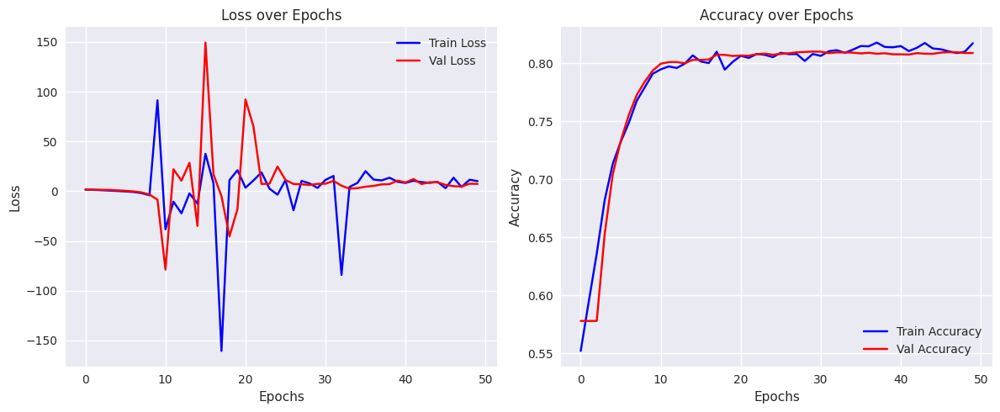

In [25]:
# TODOL:
# set batch size for training
# number of all epochs in training
# number of epochs to run before asking if you want to halt training

def calculate_accuracy(pred, target):
    pred = pred.view(-1)
    target = target.view(-1)
    pred = (pred > 0.5).float()
    accuracy = (pred == target).float().mean()
    return accuracy.item()

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
epochs = 50

for epoch in range(epochs):
    unet.train()
    epoch_train_loss = 0
    epoch_train_accuracy = 0
    num_train_batches = 0
    
    for batch in train_loader:
        imgs, msks = batch
        imgs = imgs.to(device)
        msks = msks.to(device)

        optimizer.zero_grad()
        masksHat = unet(imgs)

        loss = criterion(masksHat, msks)
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item()
        epoch_train_accuracy += calculate_accuracy(masksHat, msks)
        num_train_batches += 1

    epoch_train_loss /= num_train_batches
    epoch_train_accuracy /= num_train_batches

    unet.eval()
    epoch_val_loss = 0
    epoch_val_accuracy = 0
    num_val_batches = 0

    with torch.no_grad():
        for batch in val_loader:
            imgs, msks = batch
            imgs = imgs.to(device)
            msks = msks.to(device)

            masksHat = unet(imgs)
            loss = criterion(masksHat, msks)

            epoch_val_loss += loss.item()
            epoch_val_accuracy += calculate_accuracy(masksHat, msks)
            num_val_batches += 1

    epoch_val_loss /= num_val_batches
    epoch_val_accuracy /= num_val_batches

    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    train_accuracies.append(epoch_train_accuracy)
    val_accuracies.append(epoch_val_accuracy)

    print(f"Epoch #{epoch}: Train Loss: {epoch_train_loss:.4f}, Train Accuracy: {epoch_train_accuracy:.4f}, "
          f"Val Loss: {epoch_val_loss:.4f}, Val Accuracy: {epoch_val_accuracy:.4f}")

epochs = range(50)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss', color='blue')
plt.plot(epochs, val_losses, label='Val Loss', color='red')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, label='Train Accuracy', color='blue')
plt.plot(epochs, val_accuracies, label='Val Accuracy', color='red')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


## Plottings

/tmp/ipykernel_23/2166767559.py:30: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  psi = nn.functional.upsample(psi, size=x.size()[2:], mode='bilinear', align_corners=True)


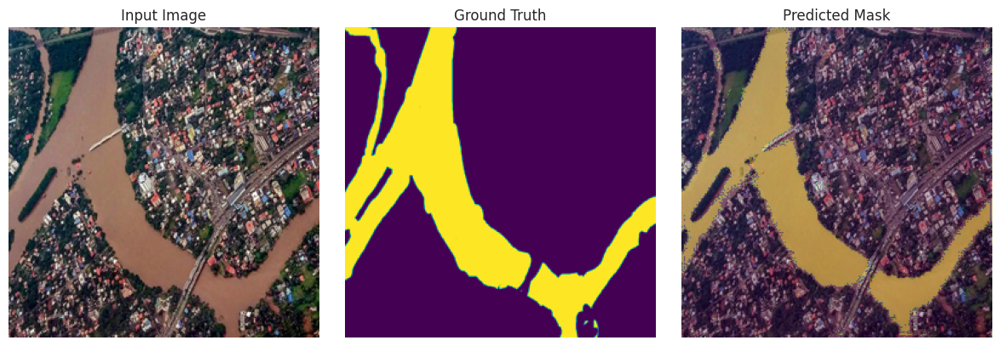

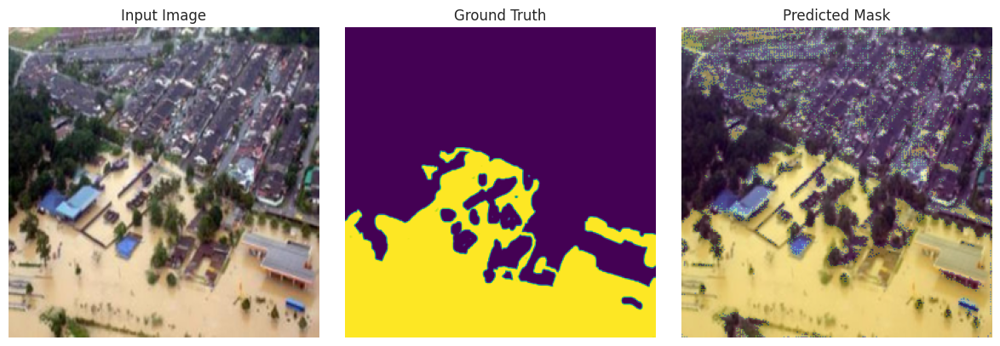

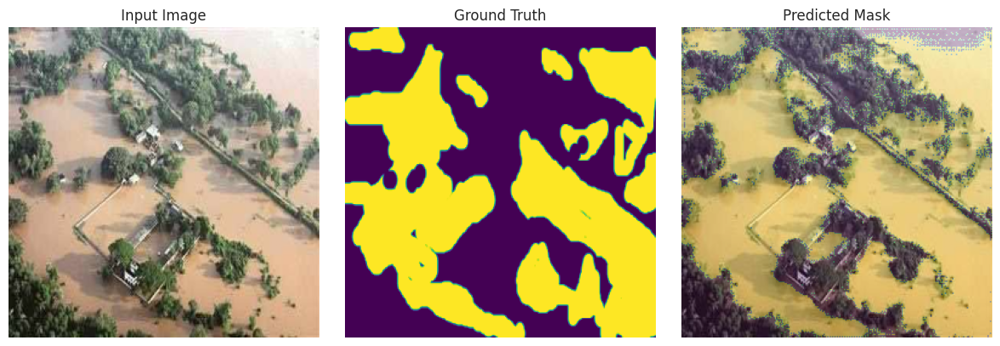

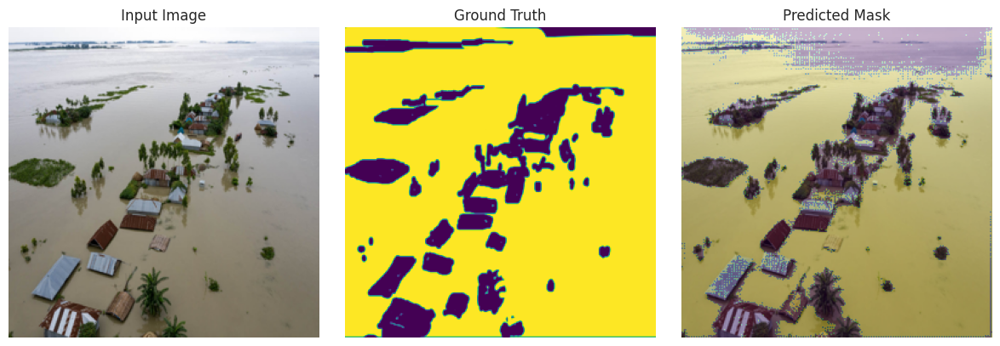

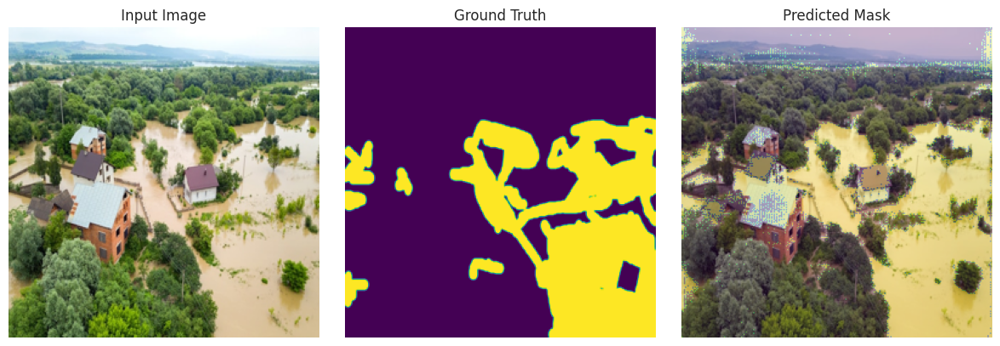

In [26]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_predictions(model, dataloader, device, num_images=5):
    model.eval() 
    images_shown = 0
    
    with torch.no_grad():
        for batch in dataloader:
            imgs, msks = batch
            imgs = imgs.to(device)
            msks = msks.to(device)

            preds = model(imgs)
            preds = torch.sigmoid(preds)

            preds = (preds > 0.5).float()

            for i in range(len(imgs)):
                if images_shown >= num_images:
                    return
                img = imgs[i].cpu().numpy().transpose(1, 2, 0)
                msk = msks[i].cpu().numpy().transpose(1, 2, 0)
                pred = preds[i].cpu().numpy().transpose(1, 2, 0)
                
                plt.figure(figsize=(12, 4))

                plt.subplot(1, 3, 1)
                plt.imshow(img)
                plt.title('Input Image')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(img)
                plt.imshow(msk[:, :, 0], cmap='viridis')
                plt.title('Ground Truth')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(img)
                plt.imshow(pred[:, :, 0], cmap='viridis', alpha=0.3)
                plt.title('Predicted Mask')
                plt.axis('off')

                plt.tight_layout()
                plt.show()

                images_shown += 1

visualize_predictions(unet, val_loader, device)


1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

Explain the difference between the predicted and processed mask above.